# <CENTER>BIRD NEST CLASSIFICATION

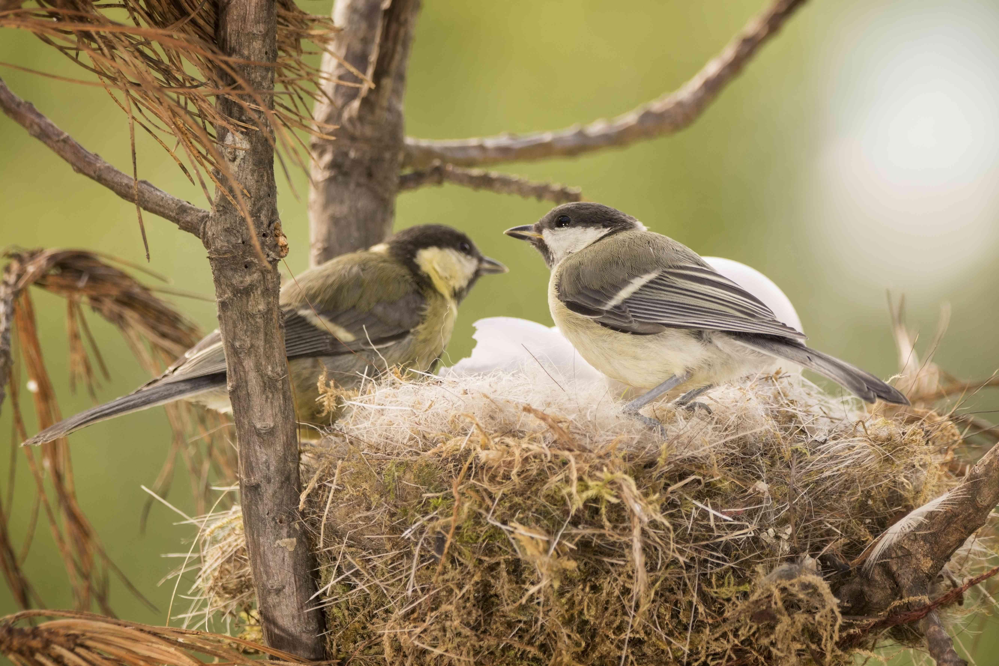

## IMPORTING LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import roc_curve,auc,accuracy_score,confusion_matrix,precision_score
from sklearn import datasets
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC,SVC
from sklearn.preprocessing import label_binarize,StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from itertools import cycle

In [2]:
data=pd.read_csv('bird.csv')

In [3]:
data.sample(10)

,id,huml,humw,ulnal,ulnaw,feml,femw,tibl,tibw,tarl,tarw,type
83,83,154.30,7.46,154.66,6.09,51.08,5.27,112.75,5.36,65.16,4.07,SW
219,219,98.94,7.13,119.72,5.60,74.17,6.30,106.50,5.80,83.13,5.86,R
149,149,138.48,7.54,157.00,6.72,62.20,5.07,116.09,5.83,72.49,3.94,W
355,355,18.68,1.62,24.78,1.40,16.16,1.12,29.67,1.06,22.09,0.78,SO
164,164,85.00,5.07,93.17,4.21,38.33,2.57,67.32,2.73,40.00,2.53,W
124,124,48.19,3.44,43.71,3.01,50.46,3.60,94.86,3.45,55.00,4.57,W
147,147,38.79,2.61,46.60,2.64,18.64,1.54,32.09,1.37,15.80,1.28,W
155,155,100.38,5.52,113.24,5.04,44.72,4.07,82.87,3.69,54.80,3.25,W
299,299,37.71,3.55,42.47,2.89,38.12,3.13,62.45,3.06,46.41,2.42,SO
56,56,310.00,14.40,315.00,9.51,88.77,8.10,180.00,9.45,96.13,7.69,SW


In [4]:
data.shape

(420, 12)

In [5]:
data.describe()

,id,huml,humw,ulnal,ulnaw,feml,femw,tibl,tibw,tarl,tarw
count,420.000000,419.000000,419.000000,417.000000,418.000000,418.000000,419.000000,418.000000,419.000000,419.000000,419.000000
mean,209.500000,64.650501,4.370573,69.115372,3.597249,36.872416,3.220883,64.662823,3.182339,39.229976,2.930024
std,121.387808,53.834549,2.854617,58.784775,2.186747,19.979082,2.023581,37.838145,2.080827,23.184313,2.185673
min,0.000000,9.850000,1.140000,14.090000,1.000000,11.830000,0.930000,5.500000,0.870000,7.770000,0.660000
25%,104.750000,25.170000,2.190000,28.050000,1.870000,21.297500,1.715000,36.417500,1.565000,23.035000,1.425000
50%,209.500000,44.180000,3.500000,43.710000,2.945000,31.130000,2.520000,52.120000,2.490000,31.740000,2.230000
75%,314.250000,90.310000,5.810000,97.520000,4.770000,47.120000,4.135000,82.870000,4.255000,50.250000,3.500000
max,419.000000,420.000000,17.840000,422.000000,12.000000,117.070000,11.640000,240.000000,11.030000,175.000000,14.090000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      420 non-null    int64  
 1   huml    419 non-null    float64
 2   humw    419 non-null    float64
 3   ulnal   417 non-null    float64
 4   ulnaw   418 non-null    float64
 5   feml    418 non-null    float64
 6   femw    419 non-null    float64
 7   tibl    418 non-null    float64
 8   tibw    419 non-null    float64
 9   tarl    419 non-null    float64
 10  tarw    419 non-null    float64
 11  type    420 non-null    object 
dtypes: float64(10), int64(1), object(1)
memory usage: 39.5+ KB


In [7]:
data.isnull().mean()*100

id       0.000000
huml     0.238095
humw     0.238095
ulnal    0.714286
ulnaw    0.476190
feml     0.476190
femw     0.238095
tibl     0.476190
tibw     0.238095
tarl     0.238095
tarw     0.238095
type     0.000000
dtype: float64

# <CENTER> UNIVARIATE ANALYSIS

## HISTOGRAM

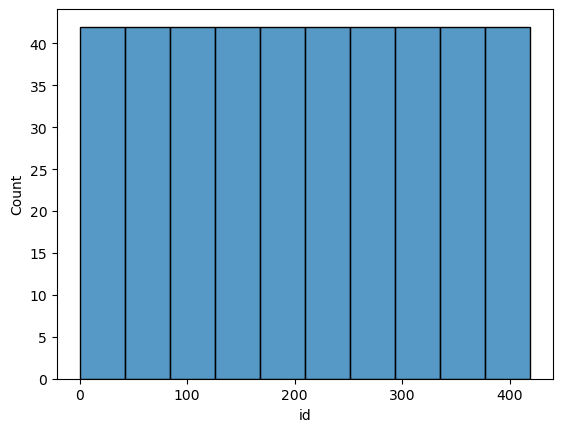

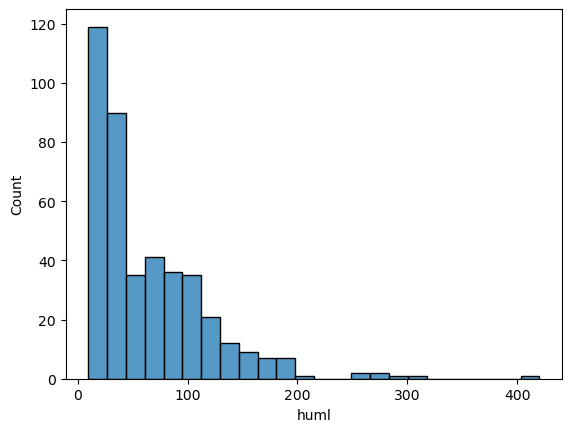

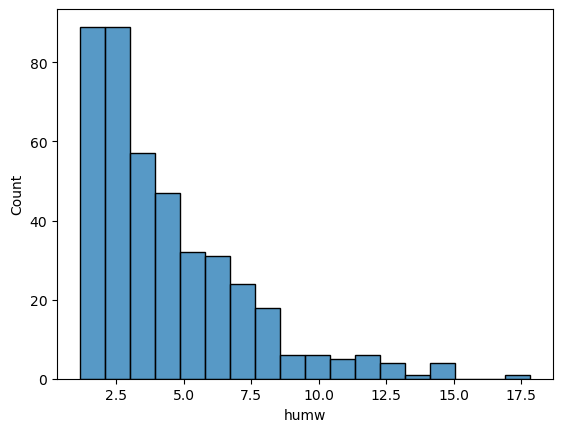

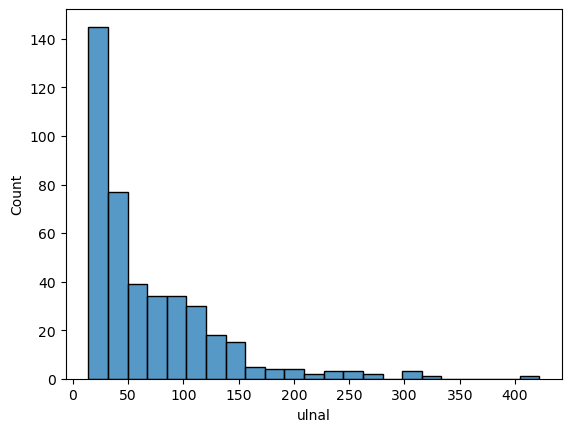

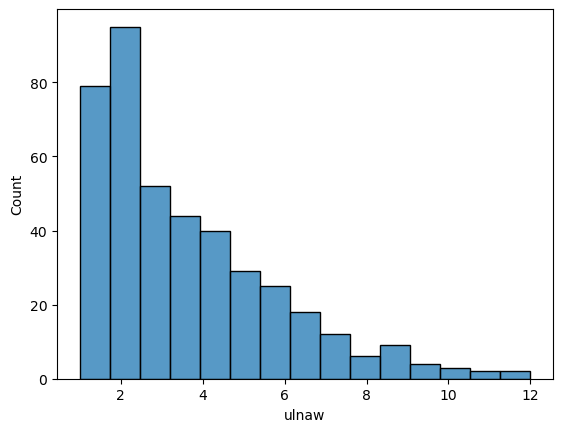

...

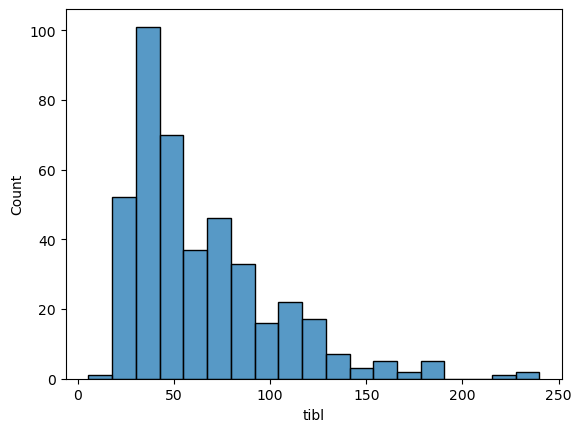

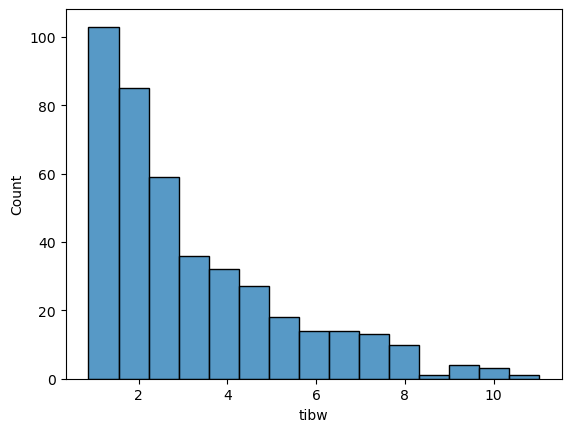

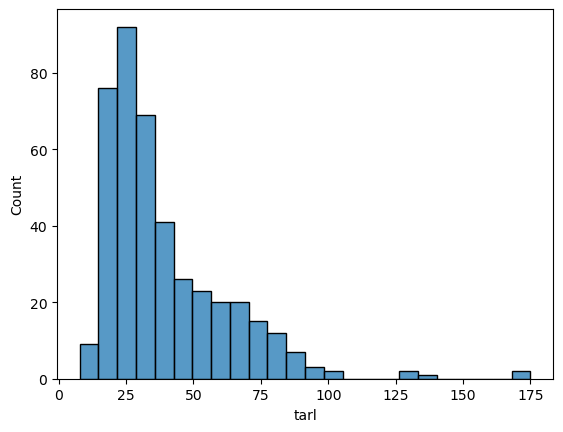

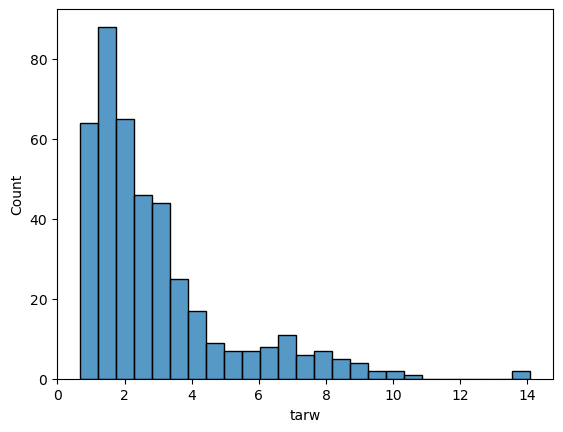

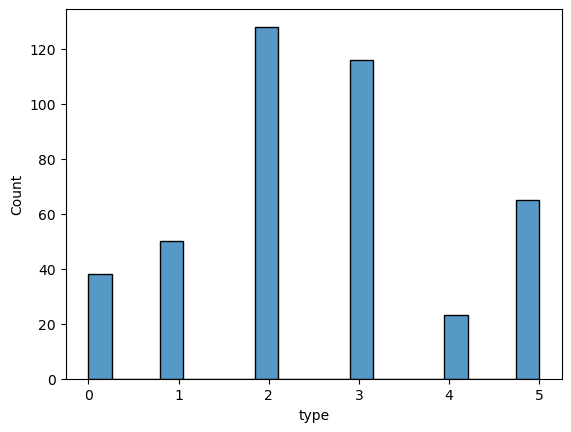

In [40]:
for i in data.columns:
    if data[i].dtype!='object':
        sns.histplot(x=data[i])
        plt.show()

## KDE PLOT

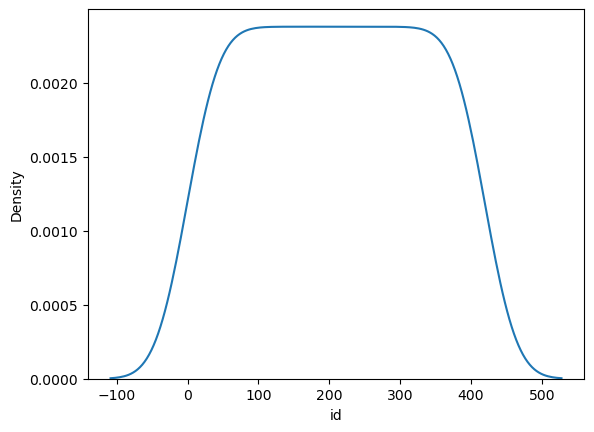

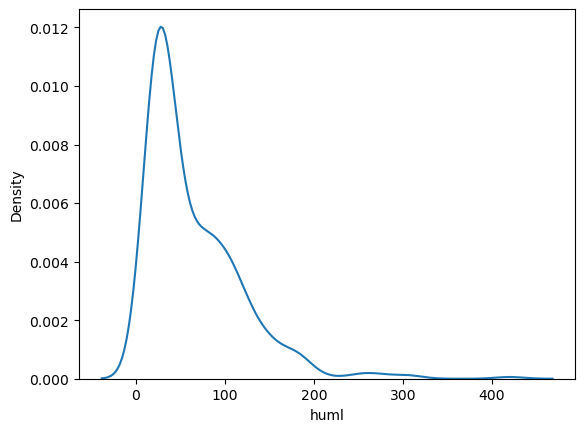

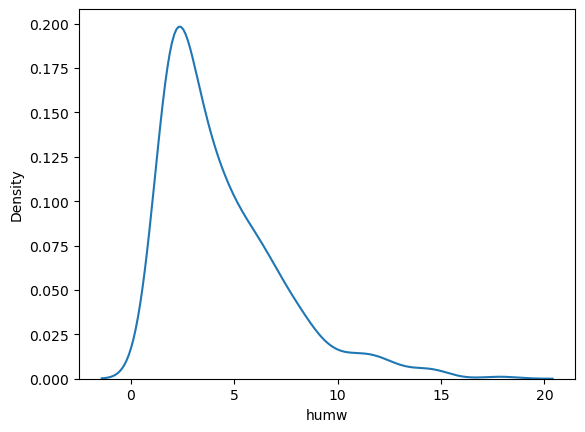

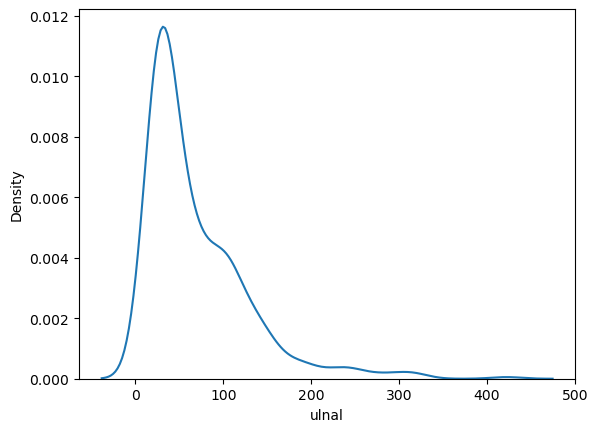

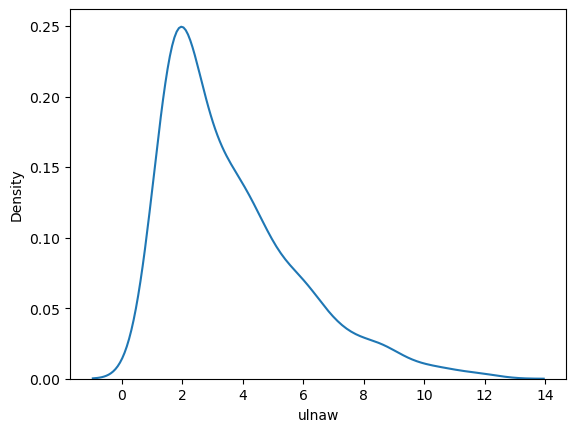

...

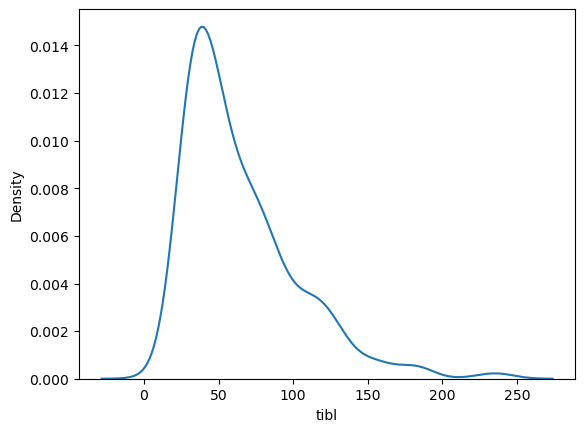

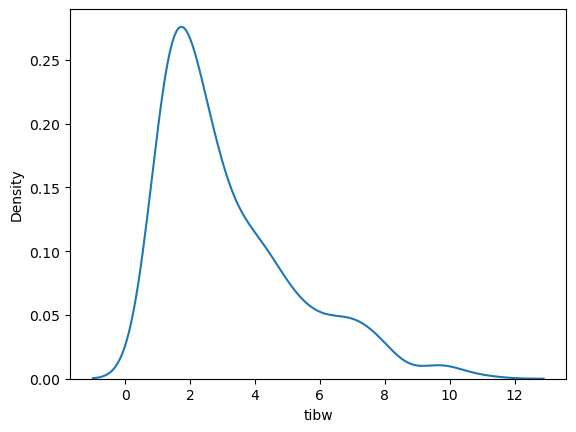

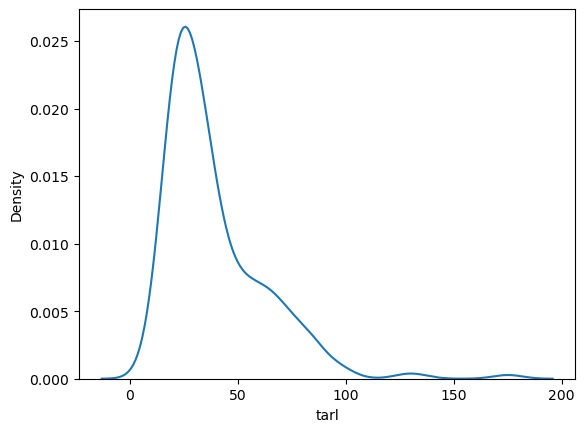

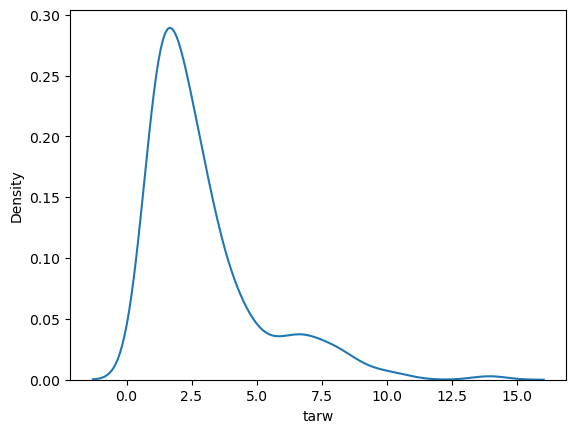

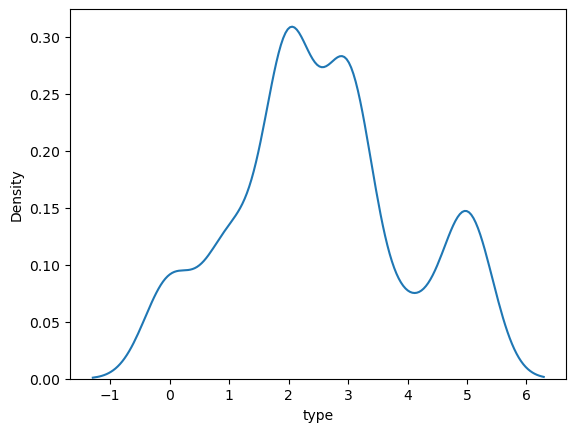

In [41]:
for i in data.columns:
    if data[i].dtype!='object':
        sns.kdeplot(x=data[i])
        plt.show()

## BOXPLOT

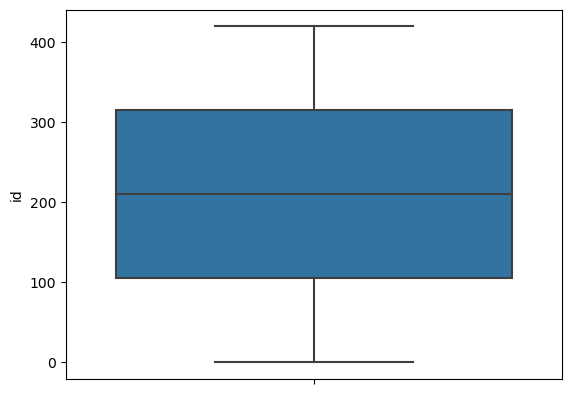

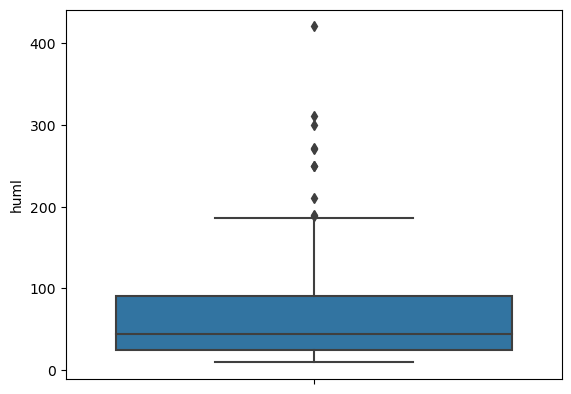

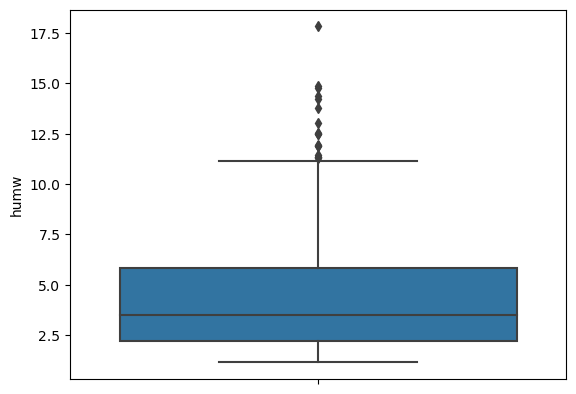

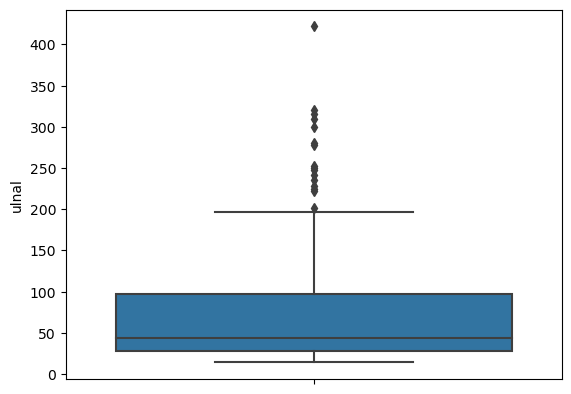

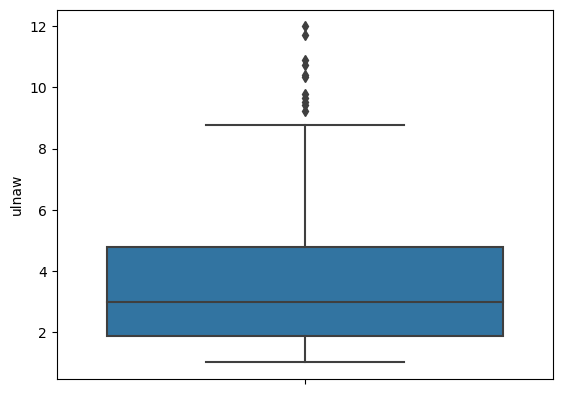

...

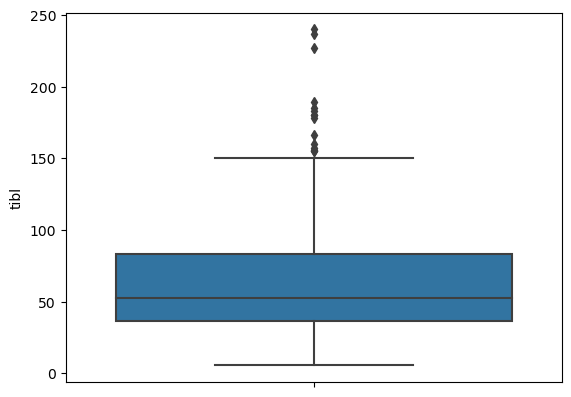

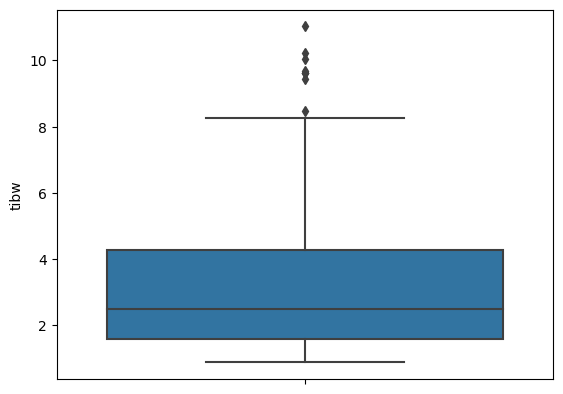

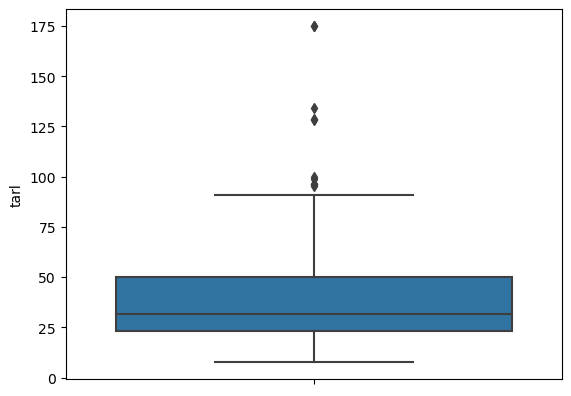

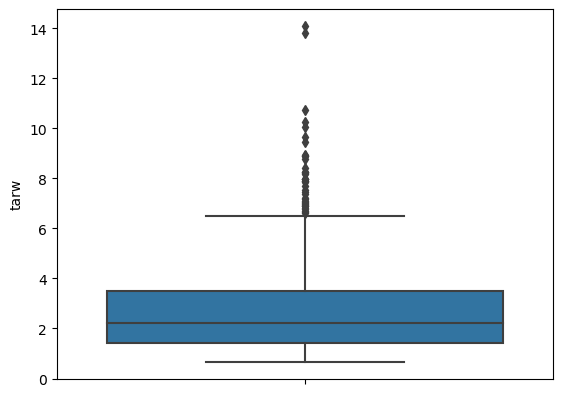

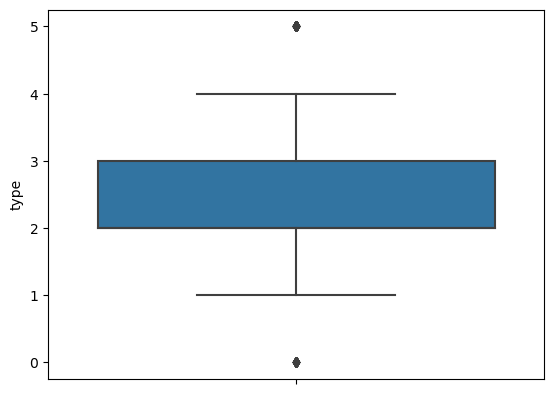

In [42]:
for i in data.columns:
    if data[i].dtype!='object':
        sns.boxplot(y=data[i])
        plt.show()

# <center>MULTIVARIATE ANALYSIS

## PIE CHART

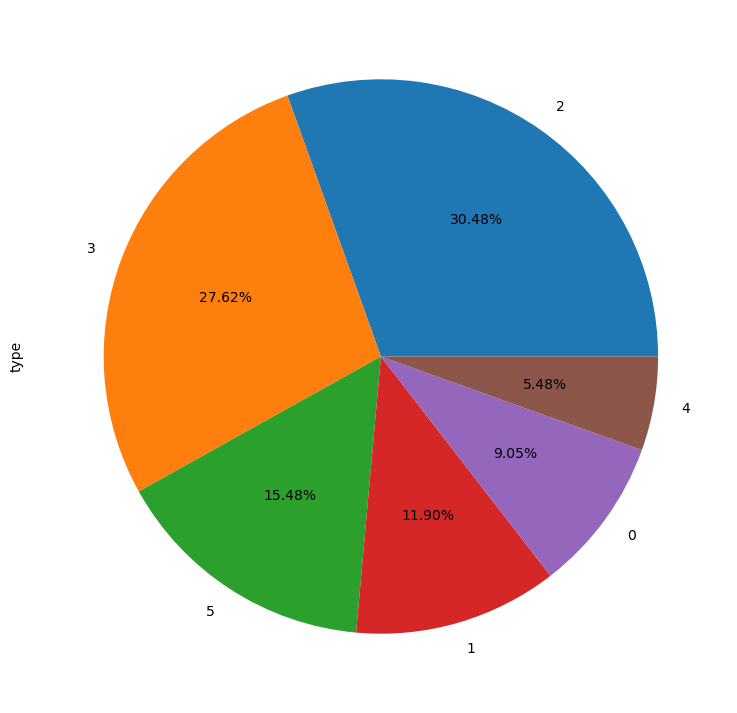

In [44]:
plt.figure(figsize=(9,9))
data.type.value_counts().plot.pie(autopct = '%1.2f%%');

## LINEPLOT

<AxesSubplot:>

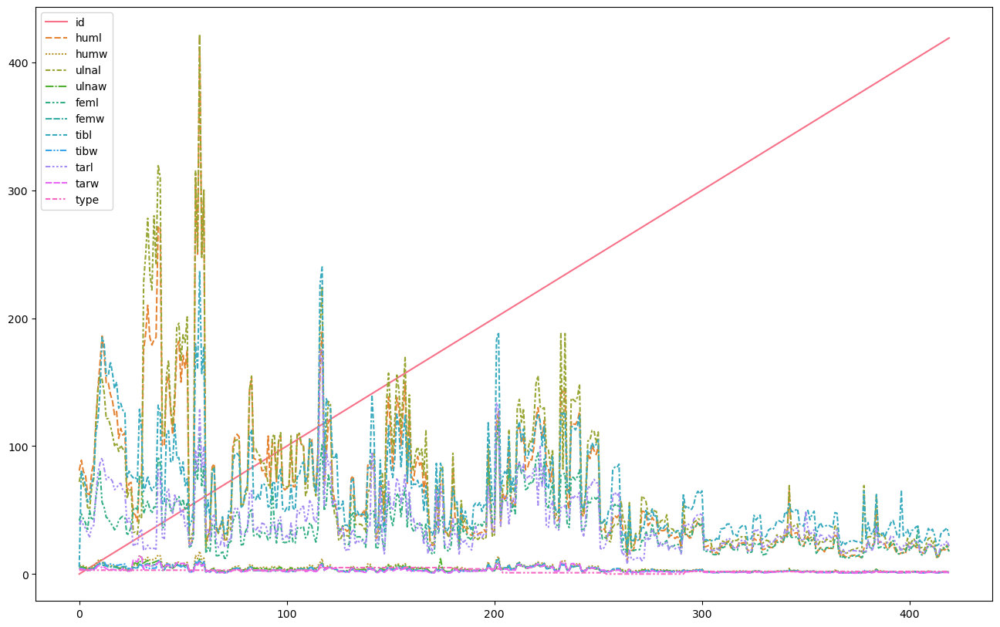

In [45]:
plt.figure(figsize=(16,10))
sns.lineplot(data=data)

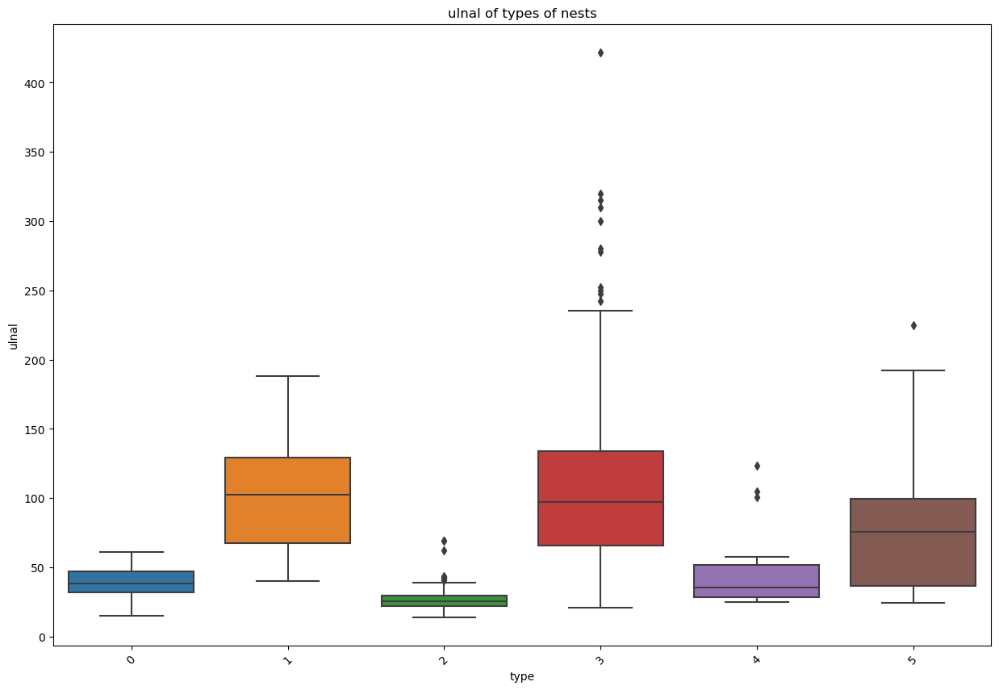

In [49]:
plt.figure(figsize=(15,10 )) 
top_brands = data['type'].value_counts().nlargest(15).index.tolist() 
sns.boxplot(x='type', y='ulnal', data=data[data['type'].isin(top_brands)]) 
plt.xticks(rotation=45)
plt.title('ulnal of types of nests')
plt.show()

## USING FILLNA METHOD

In [8]:
data['huml'].fillna((data['huml'].mean()),inplace=True)

In [9]:
data['humw'].fillna((data['humw'].mean()),inplace=True)

In [10]:
data['ulnal'].fillna((data['ulnal'].mean()),inplace=True)

In [11]:
data['ulnaw'].fillna((data['ulnaw'].mean()),inplace=True)

In [12]:
data['feml'].fillna((data['feml'].mean()),inplace=True)

In [13]:
data['femw'].fillna((data['femw'].mean()),inplace=True)

In [14]:
data['tibl'].fillna((data['tibl'].mean()),inplace=True)

In [15]:
data['tibw'].fillna((data['tibw'].mean()),inplace=True)

In [16]:
data['tarl'].fillna((data['tarl'].mean()),inplace=True)

In [17]:
data['tarw'].fillna((data['tarw'].mean()),inplace=True)

## LABEL ENCODING THE TARGET VALUE

In [18]:
cols=['type']
le=LabelEncoder()
data[cols]=data[cols].apply(le.fit_transform)

In [19]:
x=data.iloc[:,:-1].values

In [20]:
y=data.iloc[:,-1].values

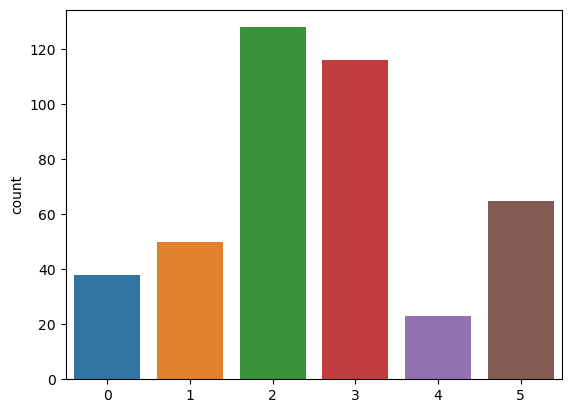

In [21]:
sns.countplot(x=y);

## WE CAN SEE THE TARGET IS NOT BALANCED

### INITIALISING THE SAMPLER

In [22]:
over_sampler=SMOTE()

In [23]:
x, y = over_sampler.fit_resample(x,y)

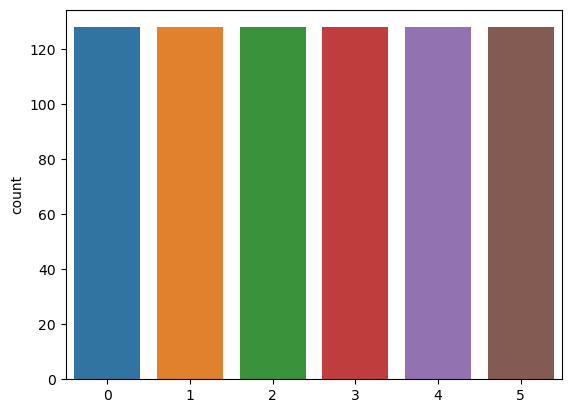

In [24]:
sns.countplot(x=y);

## NOW WE CAN SEE THAT THE DATA IS BALANCED

In [25]:
data.type.unique()

array([3, 5, 4, 1, 0, 2])

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      420 non-null    int64  
 1   huml    420 non-null    float64
 2   humw    420 non-null    float64
 3   ulnal   420 non-null    float64
 4   ulnaw   420 non-null    float64
 5   feml    420 non-null    float64
 6   femw    420 non-null    float64
 7   tibl    420 non-null    float64
 8   tibw    420 non-null    float64
 9   tarl    420 non-null    float64
 10  tarw    420 non-null    float64
 11  type    420 non-null    int32  
dtypes: float64(10), int32(1), int64(1)
memory usage: 37.9 KB


In [27]:
data.type.unique()

array([3, 5, 4, 1, 0, 2])

### SCALING

In [28]:
sc=StandardScaler()

In [29]:
x=sc.fit_transform(x)

In [30]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [31]:
model=RandomForestClassifier()

In [32]:
model.fit(x_train, y_train)
print("model trained with {}".format(model))
score_train =accuracy_score (y_train, model.predict(x_train))
score_tst = accuracy_score(y_test, model.predict(x_test))
con_train = confusion_matrix(y_train, model.predict(x_train))
con_test = confusion_matrix(y_test, model.predict(x_test))
print("Model accuracy on train is:: ",score_train)
print("Model accuracy on test is:: ", score_tst)
print("confusion_matrix train is:: ", con_train)
print("confusion_matrix test is:: ", con_test)
print("Wrong Predictions made:",(y_test !=model.predict(x_test)).sum(),'/',((y_test == model.predict(x_test)).sum()+(y_test != model.predict(x_test)).sum()))
print("*"*60)

model trained with RandomForestClassifier()
Model accuracy on train is::  1.0
Model accuracy on test is::  1.0
confusion_matrix train is::  [[103   0   0   0   0   0]
 [  0  98   0   0   0   0]
 [  0   0 102   0   0   0]
 [  0   0   0 102   0   0]
 [  0   0   0   0 102   0]
 [  0   0   0   0   0 107]]
confusion_matrix test is::  [[25  0  0  0  0  0]
 [ 0 30  0  0  0  0]
 [ 0  0 26  0  0  0]
 [ 0  0  0 26  0  0]
 [ 0  0  0  0 26  0]
 [ 0  0  0  0  0 21]]
Wrong Predictions made: 0 / 154
************************************************************


In [33]:
OUTPUT=pd.DataFrame(zip(y,model.predict(x)),columns=("ACTUAL","PREDICTION"),dtype=int)

In [34]:
OUTPUT.head(10)

,ACTUAL,PREDICTION
0,3,3
1,3,3
2,3,3
3,3,3
4,3,3
5,3,3
6,3,3
7,3,3
8,3,3
9,3,3


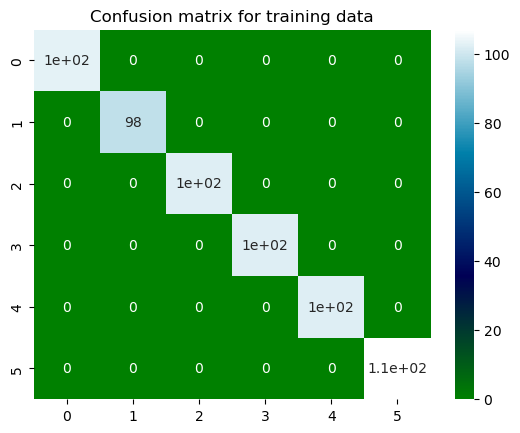

In [35]:
plt.title("Confusion matrix for training data")
sns.heatmap(con_train,annot=True,cmap='ocean');

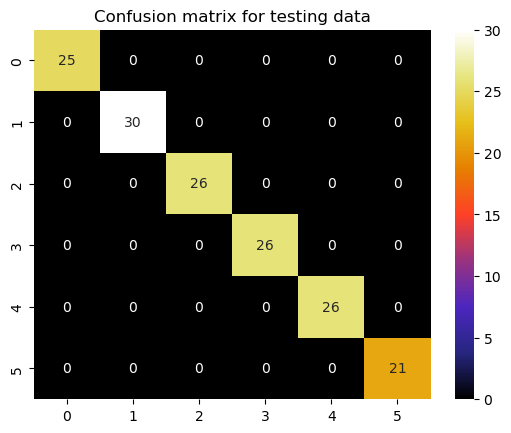

In [36]:
plt.title("Confusion matrix for testing data")
sns.heatmap(con_test, annot=True, cmap='CMRmap');

## WE HAVE TO BINARISE THE TARGET

In [37]:
y = label_binarize(y, classes=[3, 5, 4, 1, 0, 2])
n_classes = 6

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)

# <CENTER> ALTERNATIVE METHOD

### USING RANDOMFOREST CLASSIFIER

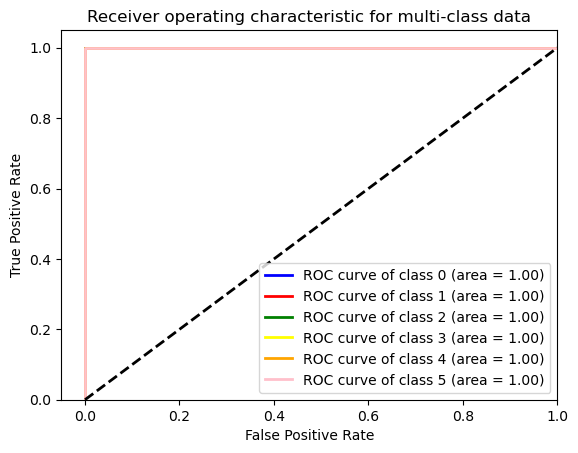

In [39]:
classifier = OneVsRestClassifier(RandomForestClassifier(random_state=0))
y_score = classifier.fit(x_train, y_train).predict_proba(x_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
lw=2
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow', 'orange', 'pink'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()